In [1]:
import numpy as np
from matplotlib import animation
from matplotlib import pyplot as plt

In [2]:
boid_count = 10

limits = np.array([2000, 2000])

positions = np.random.rand(2, boid_count) * limits[:, np.newaxis]
positions

array([[   6.24043533,  980.06274517,  147.55494122, 1117.0018292 ,
        1881.21893678,  710.32711422, 1976.18142684,  892.73837528,
        1752.98297504,  509.98250269],
       [1134.546016  , 1415.10186702, 1854.90844635, 1023.72345989,
        1425.23063336, 1856.14694132,  639.5334585 , 1300.05079978,
        1158.64890402, 1110.28944159]])

In [3]:
limits[:, np.newaxis]

array([[2000],
       [2000]])

In [4]:
def new_flock(count, lower_limits, upper_limits):
    width = upper_limits - lower_limits
    return (lower_limits[:, np.newaxis] + np.random.rand(2, count) * width[:, np.newaxis])

In [5]:
positions = new_flock(boid_count, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(boid_count, np.array([0, -20]), np.array([10, 20]))

### Flying in a Straight Line

In [6]:
positions += velocities

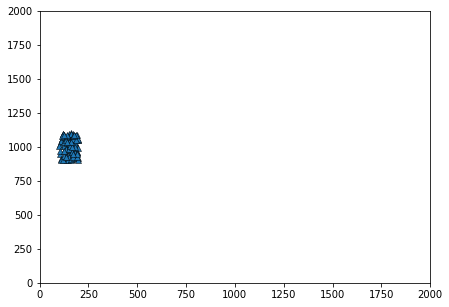

In [7]:
# create a simple plot
# initial x position in [100, 200], initial y position in [900, 1100]
# initial x velocity in [0, 10], initial y velocity in [-20, 20]
positions = new_flock(100, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(100, np.array([0, -20]), np.array([10, 20]))

figure = plt.figure(figsize=(7,5))
axes = plt.axes(xlim=(0, limits[0]), ylim=(0, limits[1]))
scatter = axes.scatter(positions[0, :], positions[1, :],
                       marker='^', edgecolor='k', lw=0.5)
scatter
plt.show()

In [8]:
def update_boids(positions, velocities):
    positions += velocities

def animate(frame):
    update_boids(positions, velocities)
    scatter.set_offsets(positions.transpose())

In [16]:
anim = animation.FuncAnimation(figure, animate,
                               frames=200, interval=50)

positions = new_flock(20, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(20, np.array([0, -20]), np.array([10, 20]))
anim.save('boids1.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [17]:
from IPython.display import HTML
positions = new_flock(100, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(100, np.array([0, -20]), np.array([10, 20]))
HTML(anim.to_jshtml())

In [14]:
positions = new_flock(4, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(4, np.array([0, -20]), np.array([10, 20]))

In [15]:
middle = np.mean(positions, 1)
middle

array([ 151.48484976, 1026.11235438])

In [13]:
direction_to_middle = positions - middle[:, np.newaxis]

In [14]:
def update_boids(positions, velocities):
    move_to_middle_strength = 0.01
    middle = np.mean(positions, 1)
    direction_to_middle = positions - middle[:, np.newaxis]
    velocities -= direction_to_middle * move_to_middle_strength
    positions += velocities
    
def animate(frame):
    update_boids(positions, velocities)
    scatter.set_offsets(positions.transpose())

### Fly towards the middle

In [16]:
anim = animation.FuncAnimation(figure, animate,
                               frames=200, interval=50)
positions = new_flock(100, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(100, np.array([0, -20]), np.array([10, 20]))
HTML(anim.to_jshtml())

### Avoiding collisions

In [17]:
positions = new_flock(4, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(4, np.array([0, -20]), np.array([10, 20]))
xpos = positions[0, :]
xsep_matrix = xpos[:, np.newaxis] - xpos[np.newaxis, :]
separations = positions[:, np.newaxis, :] - positions[:, :, np.newaxis]
separations.shape

(2, 4, 4)

In [18]:
squared_displacements = separations * separations
square_distances = np.sum(squared_displacements, 0)

In [19]:
alert_distance = 2000
close_birds = square_distances < alert_distance
close_birds

array([[ True, False, False, False],
       [False,  True, False, False],
       [False, False,  True, False],
       [False, False, False,  True]])

In [20]:
# Find the direction distances only to those birds which are too close:
separations_if_close = np.copy(separations)
far_away = np.logical_not(close_birds)

# Set x and y values in separations_if_close to zero if they are far away:
separations_if_close[0, :, :][far_away] = 0
separations_if_close[1, :, :][far_away] = 0

In [21]:
np.sum(separations_if_close, 2)

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.]])

In [22]:
velocities = velocities + np.sum(separations_if_close, 2)

In [23]:
def update_boids(positions, velocities):
    move_to_middle_strength = 0.01
    middle = np.mean(positions, 1)
    direction_to_middle = positions - middle[:, np.newaxis]
    velocities -= direction_to_middle * move_to_middle_strength

    separations = positions[:, np.newaxis, :] - positions[:, :, np.newaxis]
    squared_displacements = separations * separations
    square_distances = np.sum(squared_displacements, 0)
    alert_distance = 100
    far_away = square_distances > alert_distance
    separations_if_close = np.copy(separations)
    separations_if_close[0, :, :][far_away] = 0
    separations_if_close[1, :, :][far_away] = 0
    velocities += np.sum(separations_if_close, 1)

    positions += velocities

In [24]:
def animate(frame):
    update_boids(positions, velocities)
    scatter.set_offsets(positions.transpose())

In [25]:
anim = animation.FuncAnimation(figure, animate,
                               frames=200, interval=50)

positions = new_flock(100, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(100, np.array([0, -20]), np.array([10, 20]))
HTML(anim.to_jshtml())

### Match speed with nearby birds

In [26]:
def update_boids(positions, velocities):
    move_to_middle_strength = 0.01
    middle = np.mean(positions, 1)
    direction_to_middle = positions - middle[:, np.newaxis]
    velocities -= direction_to_middle * move_to_middle_strength

    separations = positions[:, np.newaxis, :] - positions[:, :, np.newaxis]
    squared_displacements = separations * separations
    square_distances = np.sum(squared_displacements, 0)
    alert_distance = 100
    far_away = square_distances > alert_distance
    separations_if_close = np.copy(separations)
    separations_if_close[0, :, :][far_away] = 0
    separations_if_close[1, :, :][far_away] = 0
    velocities += np.sum(separations_if_close, 1)

    velocity_differences = velocities[:, np.newaxis, :] - velocities[:, :, np.newaxis]
    formation_flying_distance = 10000
    formation_flying_strength = 0.125
    very_far = square_distances > formation_flying_distance
    velocity_differences_if_close = np.copy(velocity_differences)
    velocity_differences_if_close[0, :, :][very_far] = 0
    velocity_differences_if_close[1, :, :][very_far] = 0
    velocities -= np.mean(velocity_differences_if_close, 1) * formation_flying_strength

    positions += velocities
def animate(frame):
    update_boids(positions, velocities)
    scatter.set_offsets(positions.transpose())


anim = animation.FuncAnimation(figure, animate,
                               frames=200, interval=50)


positions = new_flock(100, np.array([100, 900]), np.array([200, 1100]))
velocities = new_flock(100, np.array([0, -20]), np.array([10, 20]))
HTML(anim.to_jshtml())